# Linear Advection


### PDE to solve:
$$\frac{\partial u}{\partial t} + a \frac{\partial u}{\partial x} = 0$$

### Background:

### Work through:
#### spatial and temporal ODEs
- temporal: $\frac{dt}{ds} = 1  \hspace{1cm} \rightarrow \hspace{1cm} t(s) = s$
- spatial: $\frac{dx}{dt} = a  \hspace{1cm} \rightarrow \hspace{1cm} x(t) = at$
- solution for $u(x, t)$: $\frac{du}{ds} = 0  \hspace{1cm} \rightarrow \hspace{1cm} u(x, t) = Const. = f(C)$

 - let: $C = x - at$
 #### Solution using method of characteristics gives:
 - Solution: $u(x, t) = f(x-at)$

### Physically why the waveform translates without changing shape


### Intial conditions
$$
u(x, 0) = 
\begin{cases}
    1, &  0.25 < x < 0.5 \\
    0, &  otherwise
\end{cases}
$$

### Numerical PDE using the Upwind scheme
- $ \frac{\partial u}{\partial t} = \frac{u^{n+1}_{i}-u^{n}_{i}}{\Delta t}$

- $ \frac{\partial u}{\partial x} = \frac{u^{n}_{i}-u^{n}_{i-1}}{\Delta x}$

- $\frac{u^{n+1}_{i}-u^{n}_{i}}{\Delta t} + a \frac{u^{n}_{i}-u^{n}_{i-1}}{\Delta x} = 0$

- $u^{n+1}_{i} = (u^n_i) - a \frac{\Delta t}{\Delta x}(u^n_i-u^n_{i-1})$

- $u^{n+1}_{i} = (u^n_i) - C (u^n_i-u^n_{i-1}) \hspace{1cm}\rightarrow\hspace{1cm}C = a \frac{\Delta t}{\Delta x}$

- Note: to my understanding of numerical solutions via python, i would want to intialize the function say $u^{n+1}_{i} = 0$ and then run a loop to update while testing boundary conditions along the way

In [31]:
# libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML




In [32]:
# domains
dt = 0.005
dx = 0.01
a = 1
C = 0.5
t = np.arange(0,10, dt)
x = np.arange(0, 10, dx)

#intialize u(x, t)
    # rows -> time
    # columns -> space
u = np.zeros((len(t), len(x)))

# initial condition
for i in range(len(x)):
    if 0.25 < x[i] < 0.5:
        u[0, i] = 1.0

for n in range(len(t) - 1):

    # left boundary condition
    u[n + 1, 0] = 0.0

    for i in range(1, len(x)):
        u[n + 1, i] = u[n, i] - C * (u[n, i] - u[n, i - 1])

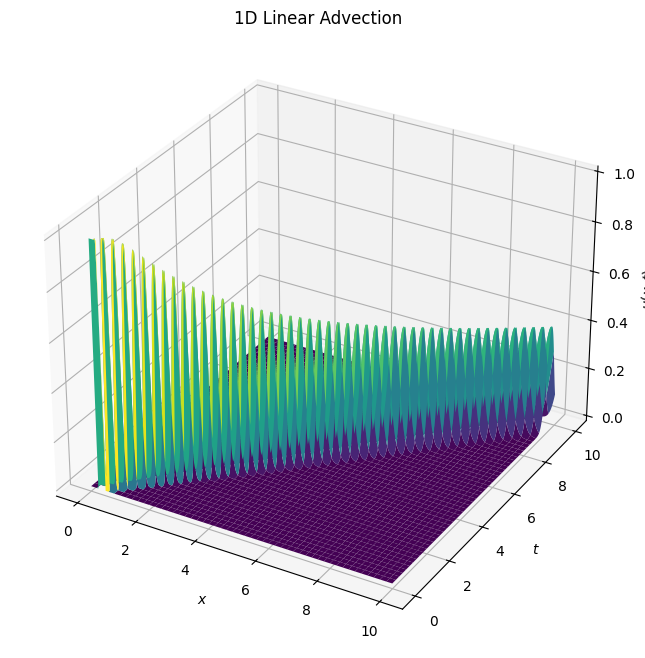

In [33]:
# Create mesh for x and t
X, T = np.meshgrid(x, t)

# 3D visualization
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

ax.plot_surface(X, T, u, cmap="viridis")

ax.set_xlabel(r"$x$")
ax.set_ylabel(r"$t$")
ax.set_zlabel(r"$u(x,t)$")
ax.set_title("1D Linear Advection")

plt.show()

In [34]:

# make animation

fig = plt.figure(figsize=(10, 6))
ax = plt.subplot(1, 1, 1)

title = ax.set_title("Time = 0")

ax.set_xlim(x.min(), x.max())
ax.set_ylim(-0.1, 1.1)

ax.set_xlabel(r"$x$")
ax.set_ylabel(r"$u(x,t)$")

line1, = ax.plot(
    [],
    [],
    color="purple",
    lw=2,
    label=r"$u(x,t)$"
)

ax.legend(loc="upper right")
ax.grid(ls="--", alpha=0.5)


def init():

    line1.set_data([], [])

    return line1,


def animate(i):

    u_now = u[i, :]

    title.set_text("Time = {:.3f}".format(t[i]))

    line1.set_data(x, u_now)

    return line1,


ani = animation.FuncAnimation(
    fig,
    animate,
    frames=range(0, len(t), 5),
    init_func=init,
    interval=30,
    blit=True
)

plt.close(fig)

HTML(ani.to_jshtml())

In [ ]:
# git status

## then to add 

# git add notebooks/linear_advection.ipynb
# git commit -m "Add linear advection notebook"
# git push


## to update

# git add .
# git commit -m "Add linear advection notebook update"
# git push origin main

In [36]:
# git add docs/Supersonic_Inlet_CFD_PDE_Roadmap.pdf
# git commit -m "Add linear advection pdf"
# git push